In [268]:
# Get thinkdsp.py

import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py

### Exercise 1

Go to http://freesound.org and download a sound sample that
includes music, speech, or other sounds that have a well-defined pitch.
Select a roughly half-second segment where the pitch is
constant.  Compute and plot the spectrum of the segment you selected.
What connection can you make between the timbre of the sound and the
harmonic structure you see in the spectrum?

Use `high_pass`, `low_pass`, and `band_stop` to
filter out some of the harmonics.  Then convert the spectrum back
to a wave and listen to it.  How does the sound relate to the
changes you made in the spectrum?

Загружаем звуки игры на пианино, взятые на сайте freesound.org и загруженные на моей репозиторий

In [269]:
if not os.path.exists('164718__bradovic__piano.wav'):
    !wget https://github.com/wooftown/spbstu-telecom/raw/main/Content/164718__bradovic__piano.wav

Читаем звуки в Wave класс

In [286]:
from thinkdsp import read_wave

wave = read_wave('164718__bradovic__piano.wav')
wave.make_audio()

Вырежем фрагмент из полной записи

In [287]:
wave = wave.segment(18.3,0.5)
wave.make_audio()

Для примерного понимания соотношения отрезка и всех звуков построим следующие графики

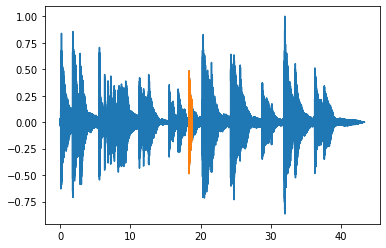

In [288]:
read_wave('164718__bradovic__piano.wav').plot()
wave.plot()

При помощи метода make_spectrum вычислим спектр звука, и для удобства построим график

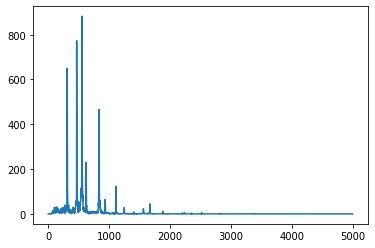

In [289]:
spectrum = wave.make_spectrum()
spectrum.plot(high=5000)

Не будем смотреть частоты выше 1250 Гц

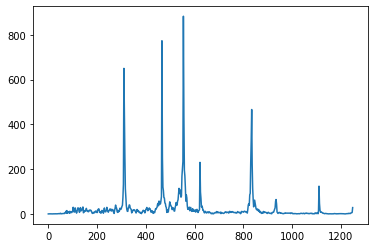

In [290]:
spectrum.plot(high=1250)

Для точного понимания какие ноты сыграны выведем список пиков частот в спектре

In [275]:
spectrum.peaks()[:10]

[(882.3500533686324, 554.0),
 (772.8812508117549, 466.0),
 (649.662314039115, 310.0),
 (466.0353893832775, 834.0),
 (455.88324114785496, 312.0),
 (435.6400663619303, 556.0),
 (328.0318016013845, 832.0),
 (260.99365239113706, 314.0),
 (251.02745102094198, 468.0),
 (234.35739758178494, 552.0)]

Я в музыке ничего не понимаю, но нашёл следующее:
*   554.36 Гц - До-диез второй октавы
*   466.16 Гц - Ля-диез первой октавы
*   311.13 Гц - Ре-диез первой октавы
*   830.60 Гц - Соль-диез второй октавы

У До-диез второй октавы самая большая амплитуда, поэтому 554.36 Гц - доминирующая частота.
Общая воспринимаемая высота звука зависит от основной частоты, тут она 311.13 Гц.




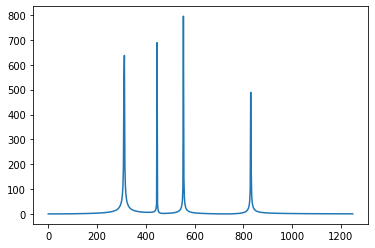

In [276]:
from thinkdsp import SinSignal, CosSignal
my_piano = CosSignal(554.36,amp=0.3,offset = 0)
my_piano += CosSignal(446.16,amp=0.25,offset = 0)
my_piano += CosSignal(311.13,amp=0.33,offset = 0)
my_piano += CosSignal(830.60,amp=0.2,offset = 0)
my_wave = my_piano.make_wave(duration=0.5)
my_spectrum = my_wave.make_spectrum()
my_spectrum.plot(high = 1250)

Тут я пытался собрать парродию на изначальный сигнал

In [277]:
my_wave.make_audio()

Добавим фильтр нижних частот. Все компоненты выше 540 ГЦ будут удалены. (На самом деле можно выбирать на сколько их ослаблять, но я решил на 100%) 

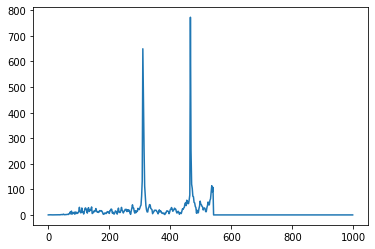

In [297]:
spectrum2 = wave.make_spectrum()
spectrum2.low_pass(540)
spectrum2.plot(high=1000)

Добавим фильтр верхних частот, и ослабим на половину компоненты до 500 Гц.

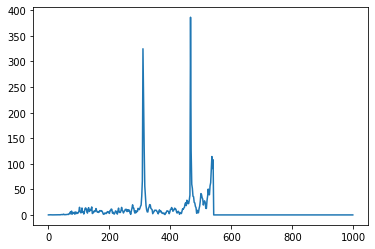

In [298]:
spectrum2.high_pass(500,0.5)
spectrum2.plot(high=1000)

Уберём частоты между Ре и Ля.

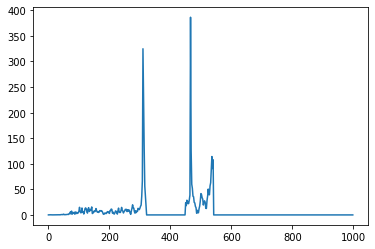

In [299]:
spectrum2.band_stop(320,450)
spectrum2.plot(high=1000)

Звучание заметно изменилось из-за изменение доиминирующей частоты, но напоминает изначальный отрезок.



In [301]:
wave = spectrum2.make_wave()
wave.make_audio()

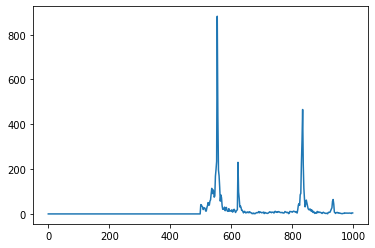

In [311]:
wave = read_wave('164718__bradovic__piano.wav')
wave = wave.segment(18.3,0.5)
spectrum2 = wave.make_spectrum()
spectrum2.high_pass(500)
spectrum2.plot(high=1000)

Отфильтровав нижние частоты звук стал более высоким


In [312]:
wave = spectrum2.make_wave()
wave.make_audio()

### Exercise 2

Synthesize a compound signal by creating SinSignal and CosSignal
objects and adding them up.  Evaluate the signal to get a Wave,
and listen to it.  Compute its Spectrum and plot it.
What happens if you add frequency
components that are not multiples of the fundamental?

Берём два сигнала с частотой одной октавы.

In [314]:
from thinkdsp import SinSignal, CosSignal
# https://nch-nch.ru/apps/frequency/
cos_sig1 = CosSignal(freq=784.00,amp=1,offset=0)
sin_sig2 = CosSignal(freq=392.00,amp=0.5,offset=0)
mix = cos_sig1 + sin_sig2
wave = mix.make_wave(duration=1)
wave.make_audio()


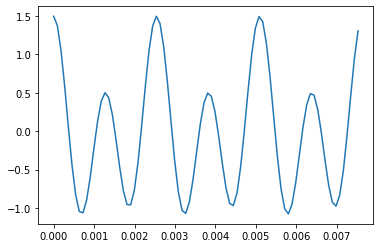

In [132]:
mix.plot()

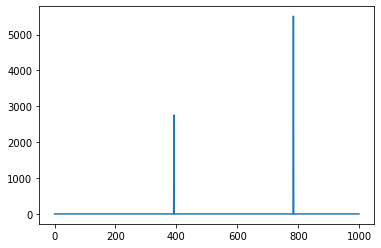

In [317]:
spectrum = wave.make_spectrum()
spectrum.plot(high = 1000)

Добавим частоту из другой октавы. Должно получится ужасно для ушей.

In [323]:
cos_signal3 = CosSignal(freq = 500, amp=0.25,offset = 0)
mix = mix + cos_signal3
wave = mix.make_wave(duration=1)
wave.make_audio()

На графике за 7мс не видно цикла.

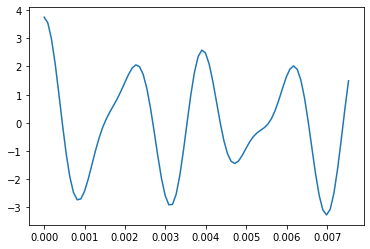

In [324]:
mix.plot()

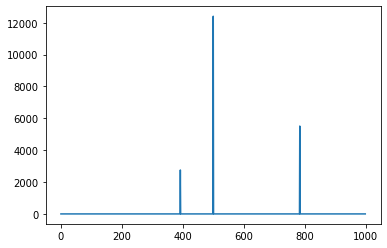

In [325]:
spectrum = wave.make_spectrum()
spectrum.plot(high = 1000)

### Exercise 3

Write a function called `stretch` that takes a Wave and a stretch factor and speeds up or slows down the wave by modifying `ts` and `framerate`.  Hint: it should only take two lines of code.

ts - отвечает за моменты выборки сигнала
framerate - число выборок в единицу времени

если умножим ts на k, то интервалы между моментами увеличатся в k раз

если framerate поделим на k, то будет меньшее число подвыборок

In [326]:
def stretch(wave, k):
  wave.ts *= k
  wave.framerate /= k
  return wave 

Ускорим исходный сигнал в 2 раза:

In [329]:
wave = read_wave('164718__bradovic__piano.wav')
stretch(wave,0.5).make_audio()